In [ ]:
# todo
# re create artifacts folder from bucket images instead of local (running top part of notebook)

# consider renaming artifacts folder to artificts_old, so that
# re run model(s) to create embeddings/index from the bucket images


#fusion results unclear, cosine similarity can't be >1. consider using only L14

In [1]:
%pip -q install -U google-cloud-storage
! pip install -r ../requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [4]:

from pathlib import Path
DEV_MODE = True  # أثناء التجارب السريعة على CPU. للإصدار النهائي اجعله False.

CONFIG = {
    "data_mode": "remote",  # "local" أو "remote"
    # "PROJECT_ROOT": Path(r"\\wsl.localhost\Ubuntu\home\othman\code\Othman-02\swipe"),
    # "/home/othman/code/benluff303/swipe-sense/models/image_embedding"),
    'PROJECT_ROOT' :  Path("/home/othman/code/benluff303/swipe-sense/models/image_embedding"),
    "IMG_DIR":      Path("images_cache"),
    "CSV_PHOTOS":   "photos.csv",
    "ART_DIR":      "artifacts",
    # على CPU: نبني الفهرس بـ B/32، ثم نعمل rerank لاحقًا بـ L/14@336
    "models": [
        {"name": "ViT-B-32", "pretrained": "openai", "weight": 1.0, "bs": 64}
    ],
    "RERANK_MODEL": "ViT-L-14-336",
    "use_336px_variant": False,
    "TIMEOUT": 12,
    "MAX_WORKERS": 16,
    "RESIZE_W": 256 if DEV_MODE else 512,
    "TOPK": 12,
    "SAMPLE_N": 1000 if DEV_MODE else None  # None = كل الصور
}


In [5]:
# %pip -q install -U open-clip-torch faiss-cpu pillow requests tqdm numpy pandas matplotlib

import os, json, hashlib, time, math, sys
import numpy as np, pandas as pd, matplotlib.pyplot as plt
import torch, torch.nn.functional as F
from PIL import Image, ImageFile
from io import BytesIO
from pathlib import Path
import requests
from concurrent.futures import ThreadPoolExecutor, as_completed
from urllib.parse import urlparse, urlunparse, parse_qs, urlencode
from requests.adapters import HTTPAdapter
from urllib3.util.retry import Retry
import faiss

# بيئة عامة
ImageFile.LOAD_TRUNCATED_IMAGES = True
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# مسارات
os.chdir(CONFIG["PROJECT_ROOT"])
Path(CONFIG["ART_DIR"]).mkdir(exist_ok=True)
Path(CONFIG["IMG_DIR"]).mkdir(exist_ok=True)
print("CWD:", Path.cwd())

# جلسة HTTP مع retry
session = requests.Session()
session.headers.update({"User-Agent": "clip-pipeline/1.0", "Accept": "image/avif,image/webp,image/*,*/*;q=0.8"})
adapter = HTTPAdapter(pool_connections=CONFIG["MAX_WORKERS"], pool_maxsize=CONFIG["MAX_WORKERS"],
                      max_retries=Retry(total=3, backoff_factor=0.25, status_forcelist=[429,500,502,503,504]))
session.mount("http://", adapter); session.mount("https://", adapter)

def clamp_unsplash(url, w=CONFIG["RESIZE_W"], auto=True):
    u = urlparse(url); q = parse_qs(u.query)
    q["w"] = [str(w)]
    if auto: q["auto"] = ["format"]
    return urlunparse(u._replace(query=urlencode(q, doseq=True)))

def cached_path_from_url(url: str, img_dir: Path=Path(CONFIG["IMG_DIR"])) -> Path:
    key = clamp_unsplash(url, w=CONFIG["RESIZE_W"])
    name = hashlib.md5(key.encode()).hexdigest() + f"_w{CONFIG['RESIZE_W']}.jpg"
    p = img_dir / name
    if not p.exists():
        r = session.get(key, timeout=CONFIG["TIMEOUT"]); r.raise_for_status()
        Image.open(BytesIO(r.content)).convert("RGB").save(p, "JPEG", quality=95, optimize=True)
    return p

def list_local_images(img_dir: Path):
    exts = {".jpg",".jpeg",".png",".webp",".bmp"}
    return sorted([p for p in img_dir.rglob("*") if p.suffix.lower() in exts])


Device: cpu
CWD: /home/othman/code/benluff303/swipe-sense/models/image_embedding


In [ ]:
# # (2) تحميل المانيفست مع أخذ العيّنة قبل التنزيل
# from concurrent.futures import ThreadPoolExecutor, as_completed

# def load_manifest():
#     mode = CONFIG["data_mode"]
#     if mode == "local":
#         paths = list_local_images(Path(CONFIG["IMG_DIR"]))
#         df = pd.DataFrame({"local_path": [str(p) for p in paths]})
#         df["photo_id"] = df["local_path"].apply(lambda s: Path(s).stem)
#         df["photo_image_url"] = None
#         return df[["photo_id","photo_image_url","local_path"]]

#     elif mode == "remote":
#         dfp = pd.read_csv(CONFIG["CSV_PHOTOS"], low_memory=False)
#         assert {"photo_id","photo_image_url"} <= set(dfp.columns), "CSV must have photo_id, photo_image_url"

#         # 👈 نُطبّق العيّنة قبل التنزيل
#         limit = CONFIG.get("SAMPLE_N")
#         if limit is not None:
#             dfp = dfp.head(int(limit)).copy()

#         urls = dfp["photo_image_url"].astype(str).tolist()
#         ids  = dfp["photo_id"].astype(str).tolist()

#         # تنزيل متوازي للصور المطلوبة فقط
#         local_paths = [None] * len(urls)
#         with ThreadPoolExecutor(max_workers=CONFIG["MAX_WORKERS"]) as ex:
#             futs = {ex.submit(cached_path_from_url, u): i for i,u in enumerate(urls)}
#             for f in as_completed(futs):
#                 i = futs[f]
#                 try:
#                     local_paths[i] = f.result()
#                 except Exception:
#                     local_paths[i] = None

#         out = pd.DataFrame({"photo_id": ids, "photo_image_url": urls, "local_path": local_paths})
#         out = out.dropna(subset=["local_path"]).reset_index(drop=True)
#         return out

#     else:
#         raise ValueError("CONFIG['data_mode'] must be 'local' or 'remote'")

# # تشغيل الخلية
# MANIFEST = load_manifest()
# MANIFEST.to_csv("gallery_manifest.csv", index=False)
# print("MANIFEST size:", len(MANIFEST))


MANIFEST size: 999


In [ ]:
import open_clip

def load_openclip(model_id="ViT-B-32", pretrained="openai", use_336=False):
    if use_336 and model_id == "ViT-L-14": model_id = "ViT-L-14@336px"
    model, preprocess, _ = open_clip.create_model_and_transforms(model_id, pretrained=pretrained)
    model = model.to(device).eval()
    tokenizer = open_clip.get_tokenizer(model_id)
    return model, preprocess, tokenizer

@torch.no_grad()
def encode_images(paths, model, preprocess, bs=32):
    feats = []
    for i in range(0, len(paths), bs):
        imgs = [preprocess(Image.open(p).convert("RGB")) for p in paths[i:i+bs]]
        x = torch.stack(imgs).to(device)
        z = model.encode_image(x)
        z = F.normalize(z, dim=-1)
        feats.append(z.detach().cpu().float())
    return torch.cat(feats, dim=0).numpy()  # (N,D)

@torch.no_grad()
def encode_texts(texts, model, tokenizer):
    tok = tokenizer(texts).to(device)
    z = model.encode_text(tok)
    z = F.normalize(z, dim=-1)
    return z.detach().cpu().float().numpy()


In [ ]:
from pathlib import Path
art = (CONFIG["PROJECT_ROOT"] / CONFIG["ART_DIR"]).resolve()
emb_fp  = art / 'image_emb_fp16.npy'
meta_fp = art / 'photo_meta.csv'

def build_image_embeds_and_meta(manifest: pd.DataFrame):
    """
     uses load_openlcip function to create embeddings for each image
     openclip set to use ViT B-32 by default
     saves these embeddings (512 dims for each 999 local images) to artifacts/'image_emb_fp16.npy'
    """
    paths = manifest["local_path"].tolist()
    # نموذج الفهرسة (B/32 من CONFIG)
    cfg = CONFIG["models"][0]
    m, pre, tok = load_openclip(cfg["name"], cfg["pretrained"], CONFIG["use_336px_variant"])
    vecs = encode_images(paths, m, pre, bs=cfg.get("bs", 32)).astype("float32")
    np.save(emb_fp, vecs.astype("float16"))
    manifest[["photo_id","photo_image_url","local_path"]].to_csv(meta_fp, index=False)
    return vecs, manifest[["photo_id","photo_image_url","local_path"]].copy()

# Load or build
if emb_fp.exists() and meta_fp.exists():
    IMAGE_EMB = np.load(emb_fp).astype("float32")
    META = pd.read_csv(meta_fp)
    # مواءمة لو حصل فرق
    if len(META) != IMAGE_EMB.shape[0]:
        META = MANIFEST.head(IMAGE_EMB.shape[0])[["photo_id","photo_image_url","local_path"]]
        META.to_csv(meta_fp, index=False)
else:
    IMAGE_EMB, META = build_image_embeds_and_meta(MANIFEST)

print("IMAGE_EMB:", IMAGE_EMB.shape, "| META:", len(META))


IMAGE_EMB: (999, 512) | META: 999


In [ ]:
"""
build and save faiss index to file artifacts/faiss_ip.index for later image lookup (INDEX variable)
"""

def build_faiss(emb):
    emb32 = emb.astype("float32")
    index = faiss.IndexFlatIP(emb32.shape[1])
    index.add(emb32)
    faiss.write_index(index, str(art/"faiss_ip.index"))
    return index

def load_faiss():
    return faiss.read_index(str(art/"faiss_ip.index"))

faiss_fp = art / "faiss_ip.index"
if faiss_fp.exists():
    INDEX = load_faiss()
    if INDEX.ntotal != len(META):
        INDEX = build_faiss(IMAGE_EMB)
else:
    INDEX = build_faiss(IMAGE_EMB)
print("INDEX.ntotal =", INDEX.ntotal); assert INDEX.ntotal == len(META)


INDEX.ntotal = 999


In [ ]:
PROMPT_TEMPLATES = [
    "a photo of {}", "a high quality photo of {}",
    "a detailed photograph of {}", "a close-up photo of {}", "an image of {}",
]

# نبني TEXT_MODELS بحيث تطابق بُعد الفهرس
D_IMG = IMAGE_EMB.shape[1]
TEXT_MODELS = []
#CONFIG[models] lists only the ViT B-32

for cfg in CONFIG["models"]:
    m, pre, tok = load_openclip(cfg["name"], cfg["pretrained"], CONFIG["use_336px_variant"])
    with torch.no_grad():
        d = m.encode_text(tok(["x"]).to(device)).shape[-1]
    if d == D_IMG:
        TEXT_MODELS.append({"name": cfg["name"], "weight": cfg["weight"], "model": m.eval().to(device), "tok": tok, "pre": pre})
    else:
        print(f"⚠️ Skipping {cfg['name']} (dim {d}) ≠ index dim {D_IMG}")
assert len(TEXT_MODELS) > 0

@torch.no_grad()
def encode_text_with_templates(query, model, tokenizer):
    texts = [t.format(query) for t in PROMPT_TEMPLATES]
    tok = tokenizer(texts).to(device)
    z = model.encode_text(tok)
    z = F.normalize(z, dim=-1).mean(dim=0)
    z = F.normalize(z, dim=-1)
    return z.detach().cpu().float().numpy()

def ensemble_text_embed(query: str) -> np.ndarray:
    parts, wtot = [], 0.0
    for item in TEXT_MODELS:
        z = encode_text_with_templates(query, item["model"], item["tok"])
        parts.append(item["weight"] * z); wtot += item["weight"]
    v = (np.sum(parts, axis=0) / max(wtot, 1e-6)).astype("float32")
    v = v / np.linalg.norm(v)
    return v

@torch.no_grad()
def image_query_embed_from_local(path: str) -> np.ndarray:
    vecs, wtot = [], 0.0
    for item in TEXT_MODELS:
        img = item["pre"](Image.open(path).convert("RGB")); x = torch.stack([img]).to(device)
        z = item["model"].encode_image(x); z = F.normalize(z, dim=-1).detach().cpu().float().numpy()[0]
        vecs.append(item["weight"] * z); wtot += item["weight"]
    v = (np.sum(vecs, axis=0) / max(wtot, 1e-6)).astype("float32")
    v = v / np.linalg.norm(v)
    return v

def image_query_embed_from_url(url: str) -> np.ndarray:
    return image_query_embed_from_local(str(cached_path_from_url(url, Path(CONFIG["IMG_DIR"]))))

def _safe_take(df, idxs):
    idxs = [int(i) for i in idxs if 0 <= int(i) < len(df)]
    return df.iloc[idxs].copy()

def search_by_text(query: str, k: int = CONFIG["TOPK"]) -> pd.DataFrame:
    q = ensemble_text_embed(query)[None, :]
    D, I = INDEX.search(q, k)
    out = _safe_take(META, I[0]);
    out["score"] = D[0][:len(out)];
    out["query"] = query
    return out.reset_index(drop=True)

def search_by_image_local(path: str, k: int = CONFIG["TOPK"]) -> pd.DataFrame:
    q = image_query_embed_from_local(path)[None, :]
    D, I = INDEX.search(q, k)
    out = _safe_take(META, I[0]); out["score"] = D[0][:len(out)]; out["query_img"] = path
    return out.reset_index(drop=True)

def search_by_image_url(url: str, k: int = CONFIG["TOPK"]) -> pd.DataFrame:
    q = image_query_embed_from_url(url)[None, :]
    D, I = INDEX.search(q, k)
    out = _safe_take(META, I[0]); out["score"] = D[0][:len(out)]; out["query_img"] = url
    return out.reset_index(drop=True)

# عرض
import matplotlib.pyplot as plt
def _fetch_show(url_or_path):
    if isinstance(url_or_path, str) and url_or_path.startswith("http"):
        r = session.get(clamp_unsplash(url_or_path), timeout=CONFIG["TIMEOUT"]); r.raise_for_status()
        return Image.open(BytesIO(r.content)).convert("RGB")
    return Image.open(url_or_path).convert("RGB")

def show_grid(df, title=None, max_cols=6):
    n=len(df); cols=min(n,max_cols); rows=(n+cols-1)//cols
    plt.figure(figsize=(3.2*cols,3.2*rows))
    for i,(_,row) in enumerate(df.iterrows(),1):
        src = row["photo_image_url"] if pd.notna(row["photo_image_url"]) else row["local_path"]
        img = _fetch_show(src); plt.subplot(rows, cols, i); plt.imshow(img); plt.axis("off")
        plt.title(f"{row.get('score',0):.3f}", fontsize=9)
    if title: plt.suptitle(title, y=0.99); plt.tight_layout(); plt.show()


In [ ]:
@torch.no_grad()
def rerank_with_model(results_df: pd.DataFrame, query_text: str=None, query_image_url: str=None,
                      model_name: str = CONFIG["RERANK_MODEL"], pretrained: str = "openai") -> pd.DataFrame:
    """ default rerank model ViT L-14
    """

    m, pre, tok = load_openclip(model_name, pretrained, use_336=False); m = m.eval().to(device)
    if query_text is not None:
        q = encode_text_with_templates(query_text, m, tok)
    elif query_image_url is not None:
        p = cached_path_from_url(query_image_url, Path(CONFIG["IMG_DIR"]))
        img = pre(Image.open(p).convert("RGB")); z = m.encode_image(torch.stack([img]).to(device))
        q = F.normalize(z, dim=-1).detach().cpu().float().numpy()[0]
    else:
        raise ValueError("pass query_text or query_image_url")
    vecs = []
    for _, r in results_df.iterrows():
        img = pre(Image.open(r["local_path"]).convert("RGB"))
        z = m.encode_image(torch.stack([img]).to(device))
        vecs.append(F.normalize(z, dim=-1).detach().cpu().float().numpy()[0])
    V = np.stack(vecs).astype("float32")
    scores = V @ q.astype("float32")
    out = results_df.copy(); out["rerank_score"] = scores
    return out.sort_values("rerank_score", ascending=False).reset_index(drop=True)

DEFAULT_LABELS = ["portrait","selfie","group photo","food","dessert","coffee","drink","car","sports car",
                  "motorcycle","landscape","cityscape","architecture","animal","cat","dog","fashion","shoe",
                  "bag","interior design","furniture","electronics","laptop","phone"]

@torch.no_grad()
def zero_shot_classify_image(path_or_url: str, labels=DEFAULT_LABELS, topk=5) -> pd.DataFrame:
    q = image_query_embed_from_url(path_or_url) if str(path_or_url).startswith("http") else image_query_embed_from_local(path_or_url)
    # نصوص
    parts, wtot = [], 0.0
    for item in TEXT_MODELS:
        tok = item["tok"]([f"a photo of {l}" for l in labels]).to(device)
        z = item["model"].encode_text(tok); z = F.normalize(z, dim=-1).detach().cpu().float().numpy()
        parts.append(item["weight"] * z); wtot += item["weight"]
    Z = np.sum(parts, axis=0) / max(wtot,1e-6); Z = Z / np.linalg.norm(Z, axis=1, keepdims=True)
    scores = (Z @ q.astype("float32")).ravel()
    out = pd.DataFrame({"label": labels, "score": scores}).sort_values("score", ascending=False).head(topk).reset_index(drop=True)
    return out


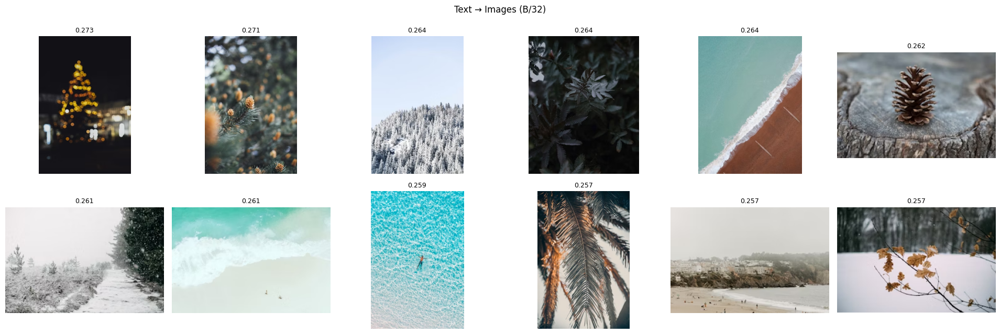

open_clip_model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

/home/othman/.pyenv/versions/swipe-sense/lib/python3.10/site-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(


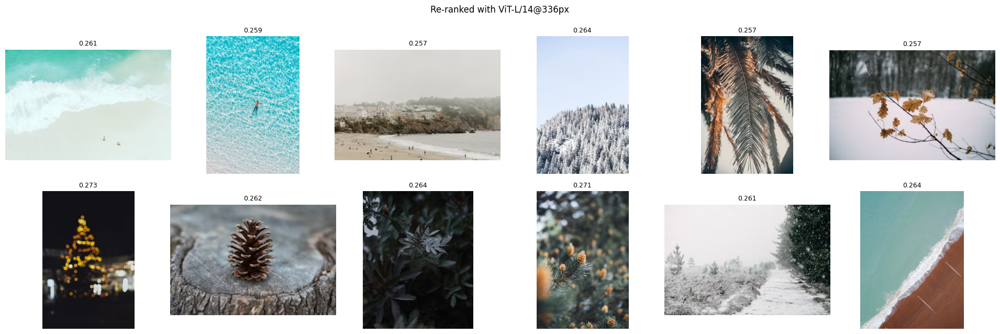

In [ ]:
res_txt = search_by_text("holiday", k=12)
show_grid(res_txt, "Text → Images (B/32)")
res_txt_r = rerank_with_model(res_txt, query_text="sunny")
show_grid(res_txt_r, "Re-ranked with ViT-L/14@336px")


In [ ]:
res_txt = search_by_text("gray red", k=12)
show_grid(res_txt, "Text → Images (B/32)")
res_txt_r = rerank_with_model(res_txt, query_text="cat")
show_grid(res_txt_r, "Re-ranked with ViT-L/14@336px")


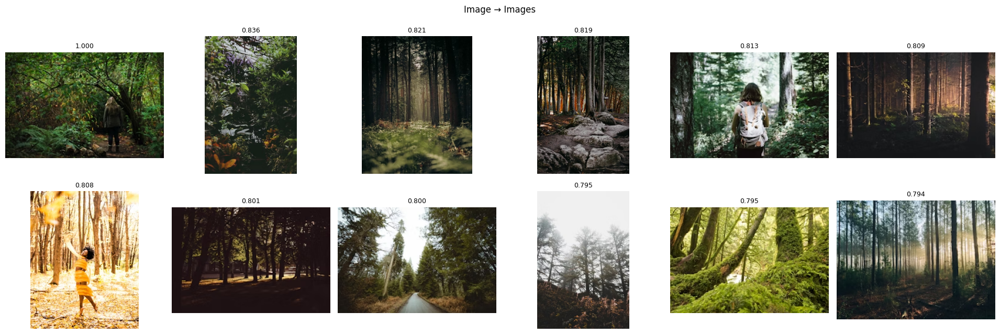

,label,score
0,landscape,0.228912
1,bag,0.219380
2,animal,0.216332
3,fashion,0.215966
4,phone,0.212635
5,portrait,0.210420


In [ ]:

seed = META.iloc[0]["photo_image_url"] if pd.notna(META.iloc[0]["photo_image_url"]) else META.iloc[0]["local_path"]
res_img = search_by_image_url(seed, k=12)
show_grid(res_img, "Image → Images")

zero_shot_classify_image(seed, topk=6)


In [ ]:

seed = META.iloc[0]["photo_image_url"] if pd.notna(META.iloc[0]["photo_image_url"]) else META.iloc[0]["local_path"]
res_img = search_by_image_url(seed, k=12)
show_grid(res_img, "Image → Images")

zero_shot_classify_image(seed, topk=6)


In [ ]:
# ===== (A) ريرنك بنموذجين + دمج الدرجات =====
import numpy as np, torch, torch.nn.functional as F
from PIL import Image
import open_clip

def _load_any(model_id, prefer=None):
    # محمّل مرن (يجرب تاقات شائعة تلقائياً)
    tries = [prefer] if prefer else []
    if "SigLIP" in model_id:
        tries += ["webli","i18n","siglip","laion2b_s32b_b82k"]
    elif "ViT-L-14-336" in model_id or "ViT-L-14" in model_id:
        tries += ["openai","laion2b_s32b_b82k","datacomp_xl_s13b_b90k"]
    else:
        tries += ["openai","laion2b_s34b_b88k","laion2b_s32b_b82k"]
    last = None
    for tag in tries:
        try:
            m, pre, _ = open_clip.create_model_and_transforms(model_id, pretrained=tag)
            tok = open_clip.get_tokenizer(model_id)
            return m.to(device).eval(), pre, tok
        except Exception as e:
            last = e
    raise last

@torch.no_grad()
def _text_feat(texts, m, tok):
    t = tok(texts).to(device)
    z = m.encode_text(t)
    return F.normalize(z, dim=-1).detach().cpu().float().numpy()

@torch.no_grad()
def _img_feats(paths, m, pre, multicrop=0):
    # multicrop=0 يعني كروب واحد (سريع). ارفعه لـ 3–5 لو تبغى دقة أعلى للـTop-K.
    if multicrop <= 1:
        xs = [pre(Image.open(p).convert("RGB")) for p in paths]
        x = torch.stack(xs).to(device)
        z = m.encode_image(x); z = F.normalize(z, dim=-1)
        return z.detach().cpu().float().numpy()
    # متوسط عدة كروبّات
    outs = []
    for p in paths:
        img = Image.open(p).convert("RGB")
        crops = [pre(img), pre(img.crop((0,0,img.width, img.height)))][:1]  # بإمكانك تحسينها لاحقًا
        x = torch.stack(crops).to(device)
        z = m.encode_image(x); z = F.normalize(z, dim=-1).mean(dim=0, keepdim=True)
        outs.append(z.detach().cpu().float())
    return torch.cat(outs, dim=0).numpy()

def multi_rerank(results_df, query_text=None, query_image_url=None,
                 models=[("ViT-L-14-336", "openai", 0.6),
                         ("ViT-B-16-SigLIP-384", "webli", 0.4)],
                 multicrop=0):
    # نجيب المسارات المرشّحة
    paths = results_df["local_path"].tolist()

    # لكل موديل: نجيب متجه الاستعلام + متجهات الصور المرشحة + نحسب درجات
    all_scores = []
    for mid, tag, w in models:
        m, pre, tok = _load_any(mid, tag)
        if query_text is not None:
            q = _text_feat([query_text], m, tok)[0]
        else:
            p = cached_path_from_url(query_image_url, Path(CONFIG["IMG_DIR"]))
            q = _img_feats([str(p)], m, pre, multicrop=multicrop)[0]

        V = _img_feats(paths, m, pre, multicrop=multicrop)
        s = (V @ q.astype("float32"))
        # طبع الدرجات مختلف بين موديلات؛ نطبّعها (z-score) قبل الدمج
        s = (s - s.mean()) / (s.std() + 1e-6)
        all_scores.append(w * s)

    # display('all_scores', all_scores)
    fused = np.sum(all_scores, axis=0)
    out = results_df.copy()
    out["fused_score"] = fused
    return out.sort_values("fused_score", ascending=False).reset_index(drop=True)


In [ ]:
# res_test = search_by_text("a red sports car at night", k=24)
# res2_test = multi_rerank(res_test, query_text="a red sports car at night",
#                     models=[("ViT-L-14-336","openai",0.55),
#                             ("ViT-B-16-SigLIP-384","webli",0.45)],
#                     multicrop=0)
# res2_test

In [ ]:
# نص → صور، ثم دمج ريرنك بموديلين
res = search_by_text("a red sports car at night", k=24)
res2 = multi_rerank(res, query_text="a red sports car at night",
                    models=[("ViT-L-14-336","openai",0.55),
                            ("ViT-B-16-SigLIP-384","webli",0.45)],
                    multicrop=0)  # جرّب 2–3 لرفع الدقة أكثر على حساب الوقت
show_grid(res2.head(12), "Fusion re-rank (CLIP L/14-336 + SigLIP B/16-384)")


In [ ]:
# ===== (B) تركيب الاستعلام (نصوص إيجابية/سلبية) + مزج نص مع صورة =====
def compose_text(query_pos:list, query_neg:list=None, w_pos=1.0, w_neg=0.6):
    # يستخدم TEXT_MODELS الحالية (نفس بُعد الفهرس)
    vecs = []
    for q in (query_pos or []):
        vecs.append(w_pos * ensemble_text_embed(q))
    if query_neg:
        for q in query_neg:
            vecs.append(-w_neg * ensemble_text_embed(q))
    v = np.sum(vecs, axis=0)
    v = v / (np.linalg.norm(v) + 1e-6)
    return v.astype("float32")

def hybrid_query(text:str=None, image_url:str=None, alpha=0.6):
    parts = []
    if text:
        parts.append(alpha * ensemble_text_embed(text))
    if image_url:
        parts.append((1-alpha) * image_query_embed_from_url(image_url))
    v = np.sum(parts, axis=0); v = v / (np.linalg.norm(v)+1e-6)
    return v.astype("float32")


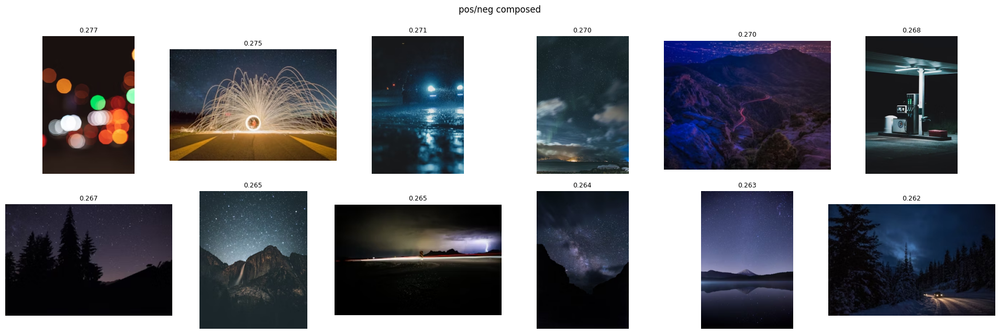

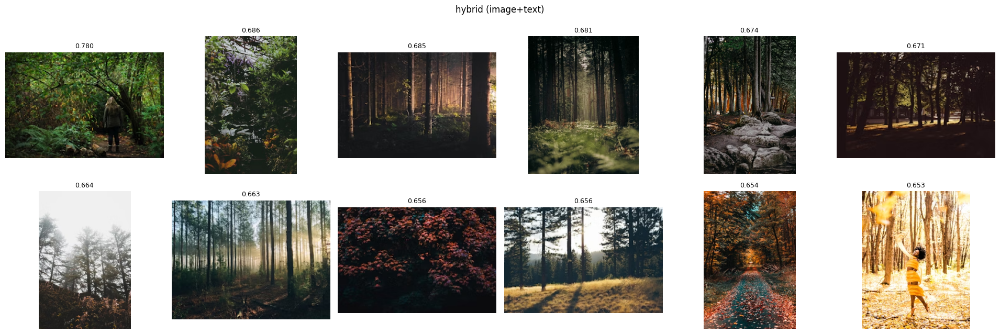

In [ ]:
# نص بإيجابي/سلبي
qv = compose_text(
    ["red sports car", "night", "long exposure"],
    ["people", "daylight", "cartoon"]
)[None,:]
D,I = INDEX.search(qv, CONFIG["TOPK"])
out = META.iloc[I[0]].copy(); out["score"] = D[0]; show_grid(out, "pos/neg composed")

# مزج صورة + نص
seed = META.iloc[0]["photo_image_url"] if pd.notna(META.iloc[0]["photo_image_url"]) else META.iloc[0]["local_path"]
qv = hybrid_query(text="more dramatic lighting", image_url=seed, alpha=0.5)[None,:]
D,I = INDEX.search(qv, 12); out = META.iloc[I[0]].copy(); out["score"]=D[0]; show_grid(out, "hybrid (image+text)")


In [ ]:
# ===== (C) عتبة تلقائية (Otsu 1D) =====
def otsu_threshold(scores: np.ndarray):
    hist, bin_edges = np.histogram(scores, bins=64)
    w0 = np.cumsum(hist); w1 = w0[-1] - w0
    mu = np.cumsum(hist * bin_edges[:-1]); mu_t = mu[-1]
    mu0 = mu / (w0 + 1e-9); mu1 = (mu_t - mu) / (w1 + 1e-9)
    var_between = w0[:-1]*w1[:-1]*(mu0[:-1]-mu1[:-1])**2
    idx = np.argmax(var_between)
    return float(bin_edges[idx])


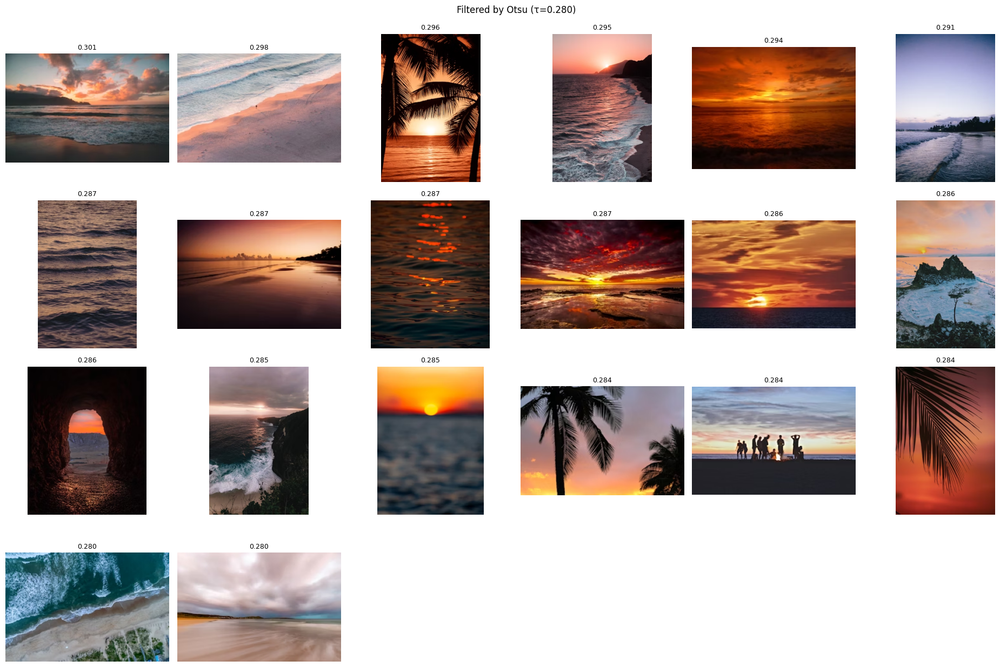

In [ ]:
res = search_by_text("sunset beach", k=50)
tau = otsu_threshold(res["score"].values)
filtered = res[res["score"] >= tau].reset_index(drop=True)
show_grid(filtered, f"Filtered by Otsu (τ={tau:.3f})")


In [ ]:
# ===== (D) MMR بسيط (على متجهات B/32 للـTop-K) =====
@torch.no_grad()
def mmr_diversify(results_df, lambda_div=0.2, k=None):
    k = k or len(results_df)
    paths = results_df["local_path"].tolist()
    # ملامح الصور من موديل الفهرسة (B/32) لسرعة التنفيذ
    m = TEXT_MODELS[0]["model"]; pre = TEXT_MODELS[0]["pre"]
    xs = [pre(Image.open(p).convert("RGB")) for p in paths]
    X = m.encode_image(torch.stack(xs).to(device))
    X = F.normalize(X, dim=-1).detach().cpu().float().numpy()  # (n,d)
    sim = X @ X.T
    rel = results_df["score"].values.copy()
    picks = [int(np.argmax(rel))]
    cand = set(range(len(paths))) - set(picks)
    while len(picks) < min(k, len(paths)):
        m_idx = -1; m_val = -1e9
        for j in cand:
            div = max(sim[j, p] for p in picks)
            val = (1-lambda_div)*rel[j] - lambda_div*div
            if val > m_val: m_val, m_idx = val, j
        picks.append(m_idx); cand.remove(m_idx)
    return results_df.iloc[picks].reset_index(drop=True)


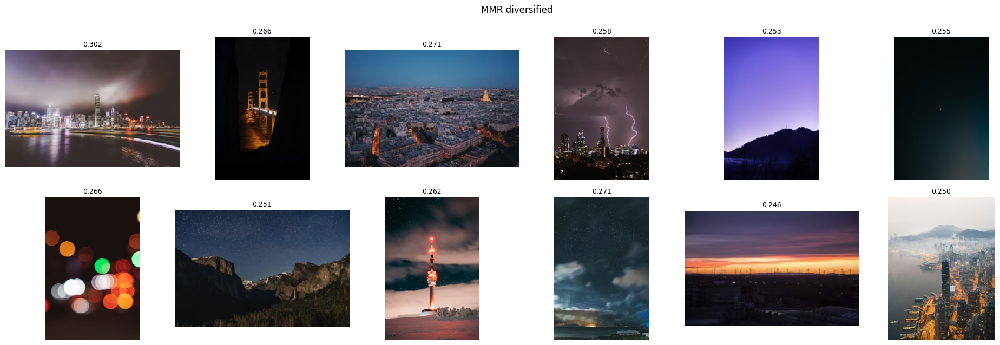

In [ ]:
res = search_by_text("city skyline at night", k=40)
res_div = mmr_diversify(res, lambda_div=0.25, k=12)
show_grid(res_div, "MMR diversified")


/home/othman/.pyenv/versions/swipe-sense/lib/python3.10/site-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(


open_clip_model.safetensors:   0%|          | 0.00/814M [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

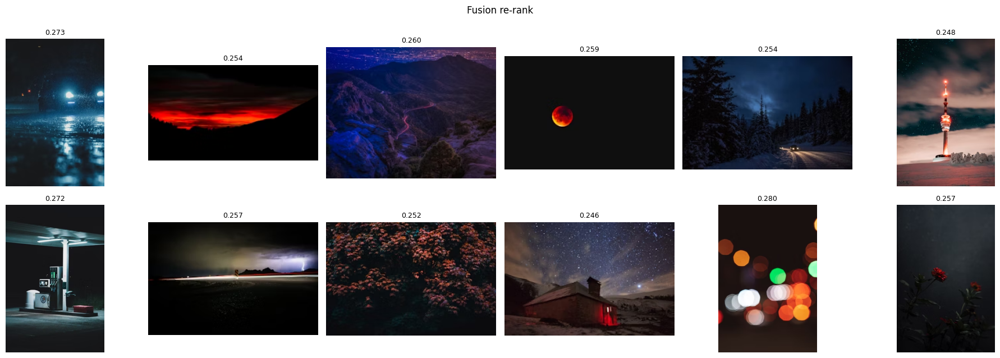

In [ ]:
res = search_by_text("red sports car at night", k=24)
res2 = multi_rerank(res, query_text="red sports car at night",
                    models=[("ViT-L-14-336","openai",0.55),
                            ("ViT-B-16-SigLIP-384","webli",0.45)],
                    multicrop=0).head(12)
show_grid(res2, "Fusion re-rank")


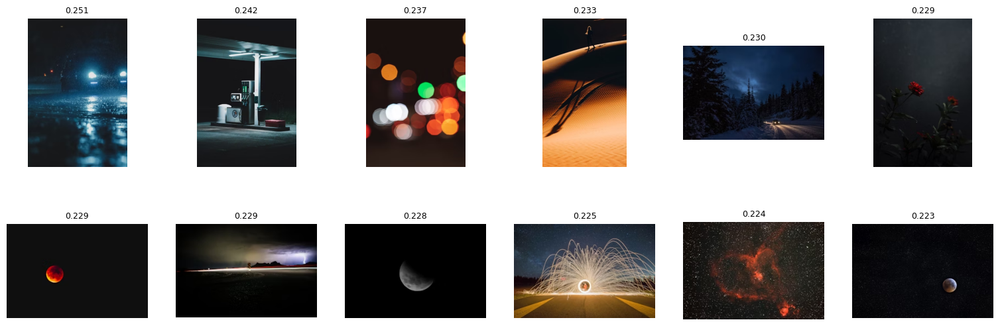

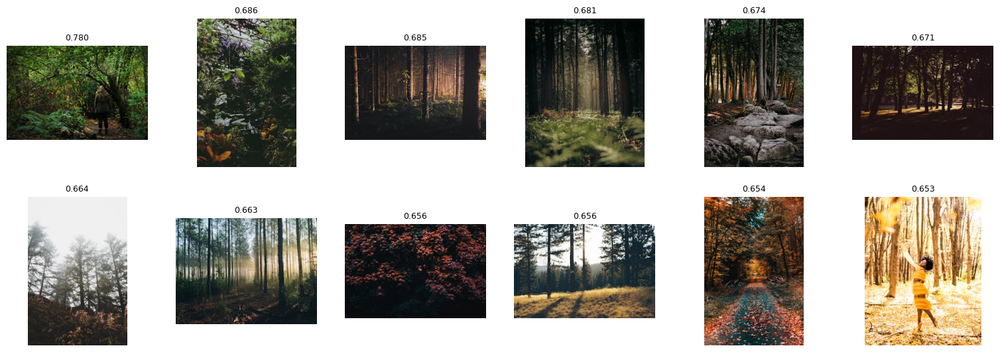

In [ ]:
qv = compose_text(["red sports car","night"], ["people","daylight"])[None,:]
D,I = INDEX.search(qv, 12); out = META.iloc[I[0]].copy(); out["score"]=D[0]; show_grid(out)

seed = META.iloc[0]["photo_image_url"] or META.iloc[0]["local_path"]
qv = hybrid_query(text="more dramatic lighting", image_url=seed, alpha=0.5)[None,:]
D,I = INDEX.search(qv, 12); out = META.iloc[I[0]].copy(); out["score"]=D[0]; show_grid(out)


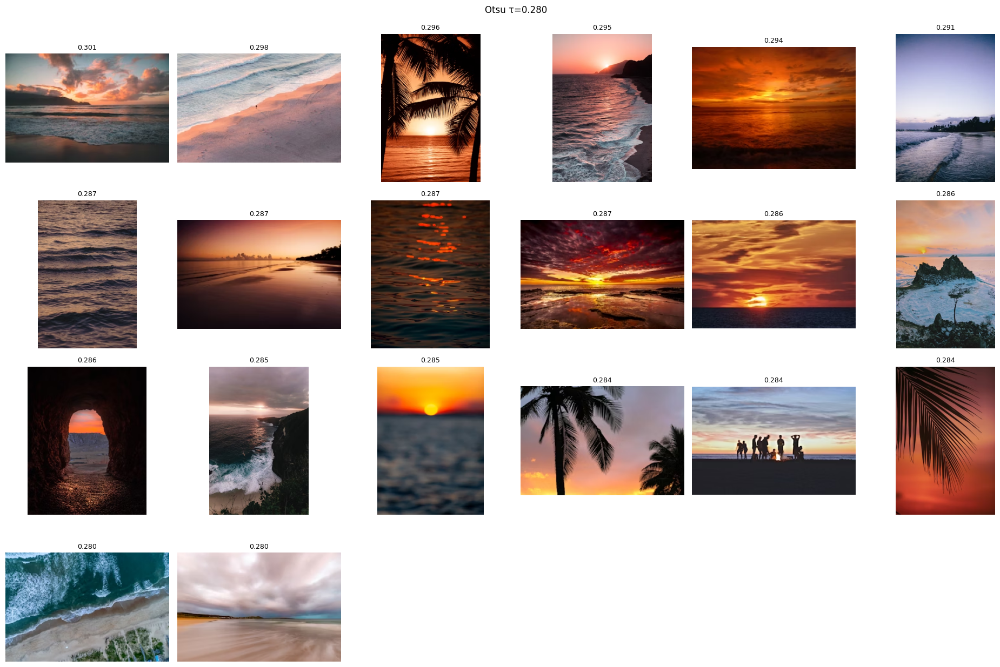

In [ ]:
res = search_by_text("sunset beach", k=50)
tau = otsu_threshold(res["score"].values)
show_grid(res[res["score"]>=tau], f"Otsu τ={tau:.3f}")


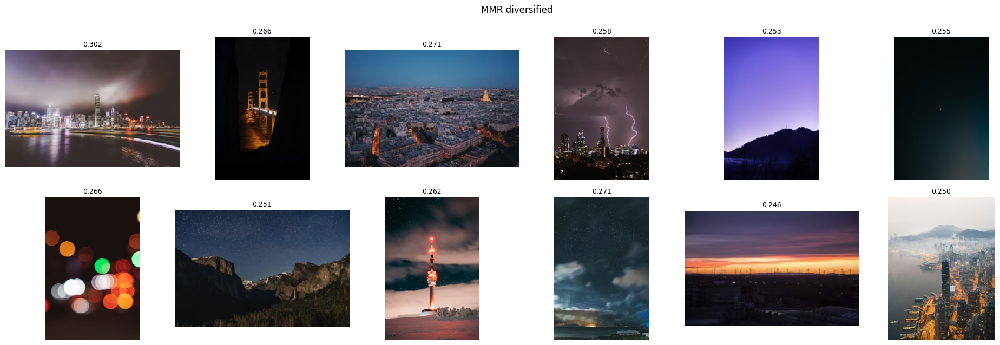

In [ ]:
res = search_by_text("city skyline at night", k=40)
res_div = mmr_diversify(res, lambda_div=0.25, k=12)
show_grid(res_div, "MMR diversified")


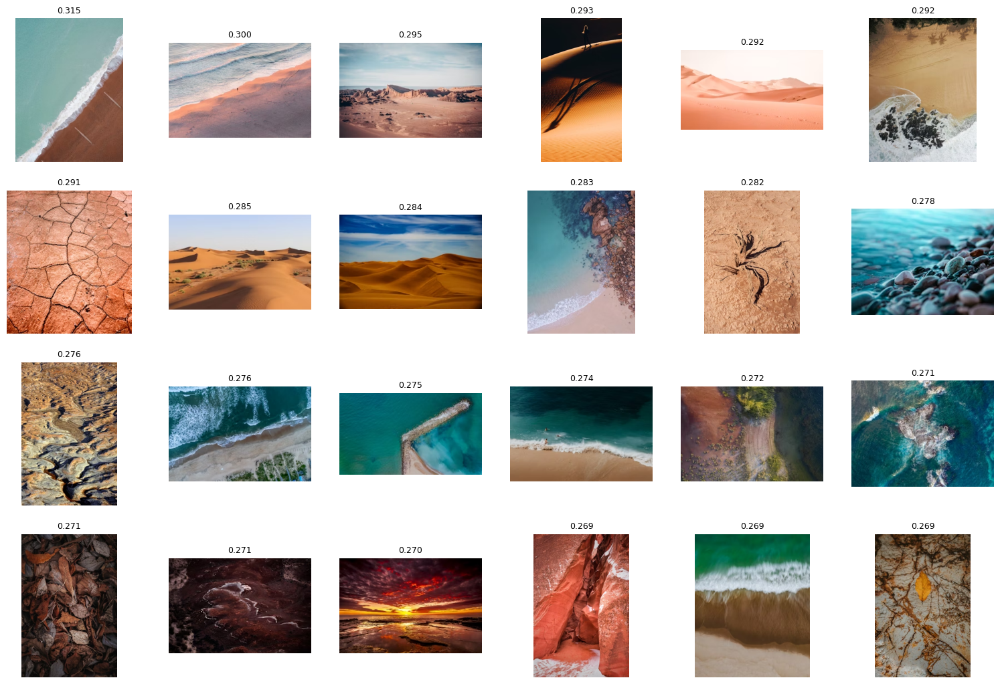

In [ ]:
res = search_by_text("red sand", k=24); show_grid(res)


/home/othman/.pyenv/versions/swipe-sense/lib/python3.10/site-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(


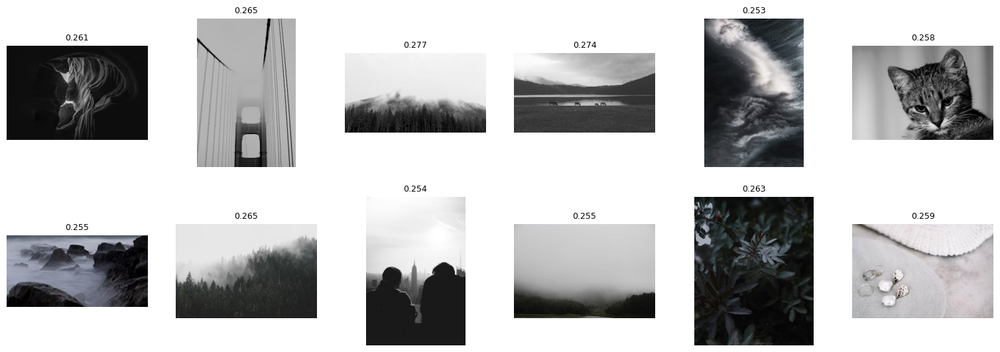

In [ ]:
res = search_by_text("grayscale monochrome gray tones", k=24)
res = multi_rerank(res, query_text="grayscale monochrome gray tones")
show_grid(res.head(12))


In [ ]:
#res = search_by_image_url("http://...", k=24)     # أو search_by_image_local("path")
#res = multi_rerank(res, query_image_url="http://...")   # اختياري لرفع الدقة
#show_grid(res.head(12))


In [ ]:
def best_text(query, k=12):
    base = search_by_text(query, k=max(k,24))
    return multi_rerank(base, query_text=query,
                        models=[("ViT-L-14-336","openai",0.6),
                                ("ViT-B-16-SigLIP-384","webli",0.4)],
                        multicrop=0).head(k)

def best_image(url_or_path, k=12):
    if str(url_or_path).startswith("http"):
        base = search_by_image_url(url_or_path, k=max(k,24))
        return multi_rerank(base, query_image_url=url_or_path,
                            models=[("ViT-L-14-336","openai",0.6),
                                    ("ViT-B-16-SigLIP-384","webli",0.4)],
                            multicrop=0).head(k)
    else:
        base = search_by_image_local(url_or_path, k=max(k,24))
        return multi_rerank(base, query_image_url=url_or_path,
                            models=[("ViT-L-14-336","openai",0.6),
                                    ("ViT-B-16-SigLIP-384","webli",0.4)],
                            multicrop=0).head(k)


/home/othman/.pyenv/versions/swipe-sense/lib/python3.10/site-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(
/home/othman/.pyenv/versions/swipe-sense/lib/python3.10/site-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(
/home/othman/.pyenv/versions/swipe-sense/lib/python3.10/site-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(
/home/othman/.pyenv/versions/swipe-sense/lib/python3.10/site-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(
/home/othman/.pyenv/versions/swipe-sense/lib/pyt

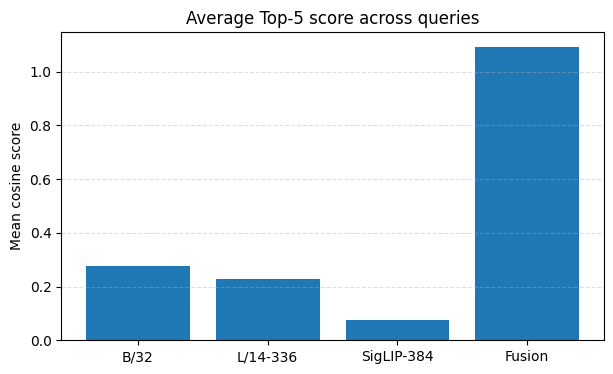

a red sports car at night
{'B/32': 0.272, 'L/14-336': 0.229, 'SigLIP-384': 0.026, 'Fusion': 1.362}
sunset over the beach
{'B/32': 0.297, 'L/14-336': 0.254, 'SigLIP-384': 0.108, 'Fusion': 0.881}
city skyline at night
{'B/32': 0.275, 'L/14-336': 0.221, 'SigLIP-384': 0.099, 'Fusion': 1.081}
cute cat portrait
{'B/32': 0.288, 'L/14-336': 0.237, 'SigLIP-384': 0.081, 'Fusion': 0.992}
modern minimal living room
{'B/32': 0.258, 'L/14-336': 0.198, 'SigLIP-384': 0.065, 'Fusion': 1.145}


In [ ]:
#NO NEED TO RERUN, just generates bar chart of model performances (best at ranking)


# # مقارنة سريعة + رسم واحد
# import numpy as np, matplotlib.pyplot as plt

# QUERIES = [
#     "a red sports car at night",
#     "sunset over the beach",
#     "city skyline at night",
#     "cute cat portrait",
#     "modern minimal living room"
# ]

# def avg_top5_score(df, score_col="score"):
#     s = df[score_col].values
#     s = np.sort(s)[::-1]
#     return float(np.mean(s[:min(5, len(s))]))

# def eval_models(queries, k=24):
#     rows = []
#     for q in queries:
#         base = search_by_text(q, k=k)
#         # CLIP L/14-336
#         clip_r = rerank_with_model(base, query_text=q, model_name="ViT-L-14-336")
#         # SigLIP B/16-384
#         sig_r  = rerank_with_model(base, query_text=q, model_name="ViT-B-16-SigLIP-384", pretrained="webli")
#         # Fusion
#         fus = multi_rerank(base, query_text=q,
#                            models=[("ViT-L-14-336","openai",0.6),
#                                    ("ViT-B-16-SigLIP-384","webli",0.4)],
#                            multicrop=0)
#         rows.append({
#             "query": q,
#             "B/32":        avg_top5_score(base, "score"),
#             "L/14-336":    avg_top5_score(clip_r, "rerank_score"),
#             "SigLIP-384":  avg_top5_score(sig_r,  "rerank_score"),
#             "Fusion":      avg_top5_score(fus,    "fused_score"),
#         })
#     return rows

# rows = eval_models(QUERIES, k=24)

# # تجميع المتوسطات لكل موديل
# labels = ["B/32", "L/14-336", "SigLIP-384", "Fusion"]
# means = [np.mean([r[l] for r in rows]) for l in labels]

# # بلوت واحد
# plt.figure(figsize=(7,4))
# plt.bar(labels, means)
# plt.title("Average Top-5 score across queries")
# plt.ylabel("Mean cosine score")
# plt.grid(axis="y", linestyle="--", alpha=0.4)
# plt.show()

# # طباعة جدول صغير للنتائج لكل استعلام
# for r in rows:
#     print(r["query"])
#     print({k: round(r[k], 3) for k in labels})


In [ ]:
# ===================== لوحة تحكّم البحث والريرنك (خلية واحدة) =====================
# تعتمد على الدوال اللي عندك: search_by_text / search_by_image_url / search_by_image_local /
# multi_rerank / rerank_with_model / compose_text / hybrid_query / show_grid / mmr_diversify / otsu_threshold
# إذا ipywidgets غير مثبّتة سيُثبّت تلقائياً.

try:
    import ipywidgets as W
    from IPython.display import display, clear_output
except Exception:
    %pip -q install ipywidgets
    import ipywidgets as W
    from IPython.display import display, clear_output

# عناصر الإدخال
mode_dd   = W.Dropdown(
    options=[("نص", "text"), ("رابط صورة", "url"), ("ملف محلي", "local"), ("هجين (صورة+نص)", "hybrid")],
    value="text", description="الوضع:"
)
q_text    = W.Text(value="", description="نص:")
q_pos     = W.Text(value="", description="(+ ) إيجابي:")
q_neg     = W.Text(value="", description="(- ) سلبي:")
q_url     = W.Text(value="", description="رابط صورة:")
q_path    = W.Text(value="", description="مسار ملف:")
alpha_sl  = W.FloatSlider(value=0.6, min=0.0, max=1.0, step=0.05, description="α (هجين):")
k_sl      = W.IntSlider(value=12, min=1, max=60, step=1, description="Top-K:")
rerank_dd = W.Dropdown(
    options=[("بدون ريرنك", "none"), ("CLIP ViT-L/14-336", "clip336"),
             ("SigLIP B/16-384", "siglip384"), ("Fusion (CLIP+SigLIP)", "fusion")],
    value="fusion", description="Re-rank:"
)
mc_sl     = W.IntSlider(value=0, min=0, max=3, step=1, description="Multicrop:")
w_clip    = W.FloatSlider(value=0.6, min=0.0, max=1.0, step=0.05, description="وزن CLIP:")
w_sigl    = W.FloatSlider(value=0.4, min=0.0, max=1.0, step=0.05, description="وزن SigLIP:")
mmr_cb    = W.Checkbox(value=False, description="تنويع MMR")
mmr_lmb   = W.FloatSlider(value=0.25, min=0.0, max=0.8, step=0.05, description="MMR λ:")
otsu_cb   = W.Checkbox(value=False, description="فلترة Otsu")
save_cb   = W.Checkbox(value=True, description="حفظ CSV")
run_btn   = W.Button(description="تشغيل الاستعلام", button_style="success")
out       = W.Output()

# إخفاء/إظهار الحقول المناسبة
def _sync_visibility(*_):
    mode = mode_dd.value
    q_text.layout.display = "none"; q_pos.layout.display = "none"; q_neg.layout.display = "none"
    q_url.layout.display  = "none"; q_path.layout.display = "none"; alpha_sl.layout.display = "none"
    if mode == "text":
        q_text.layout.display = "block"
        q_pos.layout.display  = "block"
        q_neg.layout.display  = "block"
    elif mode == "url":
        q_url.layout.display  = "block"
    elif mode == "local":
        q_path.layout.display = "block"
    elif mode == "hybrid":
        q_text.layout.display = "block"
        q_url.layout.display  = "block"
        alpha_sl.layout.display = "block"

mode_dd.observe(_sync_visibility, "value")
_sync_visibility()

# المنطق
def _compose_query_vec():
    """يبني متجه استعلام (لأوضاع النص/الهجين مع إيجابي/سلبي)؛ يرجّع None لو مش مطلوب."""
    mode = mode_dd.value
    if mode == "text":
        pos = [s.strip() for s in (q_text.value + "," + q_pos.value).split(",") if s.strip()]
        neg = [s.strip() for s in q_neg.value.split(",") if s.strip()]
        if len(pos)==0: return None
        v = compose_text(pos, neg if len(neg)>0 else None)
        return v[None, :]
    elif mode == "hybrid":
        parts = []
        if q_text.value.strip():
            parts.append( alpha_sl.value * ensemble_text_embed(q_text.value.strip()) )
        if q_url.value.strip():
            parts.append( (1.0 - alpha_sl.value) * image_query_embed_from_url(q_url.value.strip()) )
        if len(parts)==0: return None
        v = (parts[0] if len(parts)==1 else (parts[0]+parts[1]))
        v = v / (np.linalg.norm(v)+1e-6)
        # دمج الإيجابي/السلبي الإضافي إن وُجد
        extra = compose_text([q_pos.value] if q_pos.value.strip() else [],
                             [q_neg.value] if q_neg.value.strip() else [], w_pos=0.6, w_neg=0.6)
        v = v + extra
        v = v / (np.linalg.norm(v)+1e-6)
        return v[None, :]
    return None

def _search_core():
    mode = mode_dd.value
    k = max(12, int(k_sl.value))  # نجلب أكبر ثم نقص
    if mode == "text":
        base = search_by_text(q_text.value.strip() if q_text.value.strip() else q_pos.value.strip(), k=k)
    elif mode == "url":
        base = search_by_image_url(q_url.value.strip(), k=k)
    elif mode == "local":
        base = search_by_image_local(q_path.value.strip(), k=k)
    elif mode == "hybrid":
        # نستخدم المتجه المركّب مباشرة مع الفهرس
        qv = _compose_query_vec()
        if qv is None: return pd.DataFrame()
        D, I = INDEX.search(qv, k)
        base = META.iloc[I[0]].copy(); base["score"]=D[0]
    else:
        base = pd.DataFrame()
    return base

def _apply_rerank(df):
    if len(df)==0: return df
    mode = mode_dd.value
    rr = rerank_dd.value
    mc = int(mc_sl.value)
    if rr == "none":
        return df
    if rr == "clip336":
        if mode in ("text","hybrid"):
            qt = q_text.value.strip() if q_text.value.strip() else (q_pos.value.strip() or "")
            r = rerank_with_model(df, query_text=qt, model_name="ViT-L-14-336")
        else:
            r = rerank_with_model(df, query_image_url=q_url.value.strip(), model_name="ViT-L-14-336")
        return r
    if rr == "siglip384":
        if mode in ("text","hybrid"):
            r = rerank_with_model(df, query_text=(q_text.value.strip() or q_pos.value.strip()),
                                  model_name="ViT-B-16-SigLIP-384", pretrained="webli")
        else:
            r = rerank_with_model(df, query_image_url=q_url.value.strip(),
                                  model_name="ViT-B-16-SigLIP-384", pretrained="webli")
        return r
    if rr == "fusion":
        if mode in ("text","hybrid"):
            r = multi_rerank(df, query_text=(q_text.value.strip() or q_pos.value.strip()),
                             models=[("ViT-L-14-336","openai",float(w_clip.value)),
                                     ("ViT-B-16-SigLIP-384","webli",float(w_sigl.value))],
                             multicrop=mc)
        else:
            r = multi_rerank(df, query_image_url=q_url.value.strip(),
                             models=[("ViT-L-14-336","openai",float(w_clip.value)),
                                     ("ViT-B-16-SigLIP-384","webli",float(w_sigl.value))],
                             multicrop=mc)
        return r
    return df

def _post_process(df):
    out = df.copy()
    if otsu_cb.value and "score" in out.columns:
        tau = otsu_threshold(out["score"].values)
        out = out[out["score"]>=tau].reset_index(drop=True)
    if mmr_cb.value and len(out)>0:
        out = mmr_diversify(out, lambda_div=float(mmr_lmb.value), k=int(k_sl.value))
    return out.head(int(k_sl.value))

def _on_run(_):
    with out:
        clear_output(wait=True)
        base = _search_core()
        after = _apply_rerank(base)
        final = _post_process(after)
        if len(final)==0:
            print("لا توجد نتائج.")
            return
        # الرسم
        ttl = f"{mode_dd.label} | k={k_sl.value} | rerank={rerank_dd.label}"
        show_grid(final, ttl)
        # ملخص صغير + حفظ
        print(f"\nعدد النتائج: {len(final)}")
        cols = [c for c in ["photo_id","photo_image_url","local_path"] if c in final.columns] + [c for c in ["score","rerank_score","fused_score"] if c in final.columns]
        display(final[cols].head(20))
        if save_cb.value:
            out_fp = (CONFIG["PROJECT_ROOT"]/CONFIG["ART_DIR"]/ "last_results.csv").resolve()
            final.to_csv(out_fp, index=False)
            print("Saved:", out_fp)

run_btn.on_click(_on_run)

# تخطيط الواجهة
left  = W.VBox([mode_dd, q_text, q_pos, q_neg, q_url, q_path, alpha_sl])
mid   = W.VBox([k_sl, rerank_dd, mc_sl, w_clip, w_sigl])
right = W.VBox([mmr_cb, mmr_lmb, otsu_cb, save_cb, run_btn])

_display = W.HBox([left, W.Label("  "), mid, W.Label("  "), right])
display(_display, out)
# ================================================================================


Output()